# Preliminary operations

In [1]:
#@title Drive mount

from google.colab import drive
drive.mount('/content/gdrive')

%cd /content/gdrive/MyDrive/Assignment/OriginalDataset

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1lbwLgXuDnIZzcU31iWDOKo7YxctY6mF-/Assignment/OriginalDataset


In [2]:
#@title Main libraries
import pandas as pd
import numpy as np

import os
import random

from sklearn.utils import  compute_class_weight

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

import tensorflow as tf
tfk = tf.keras
tfkl = tf.keras.layers

!pip install lime
import lime
from lime import lime_image

import cv2
import matplotlib.cm as cm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 18.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=060015c086957e2abeac1acb6d01ac4485a2aecbb3a3275a420862fa751760b4
  Stored in directory: /root/.cache/pip/wheels/e6/a6/20/cc1e293fcdb67ede666fed293cb895395e7ecceb4467779546
Successfully built lime


In [3]:
#@title Reproducibility
# Setting a seed for reproducibility
seed = 90 
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print("The seed is: " + str(seed))

The seed is: 90


# Utils


In [4]:
#@title Access image
import csv
import pandas as pd

data_hyperparameters = {
    'batch_size': 1,
    'resized_shape_height': 224,
    'resized_shape_width': 224,
    'color_mode': 'rgb'
}

n_channels = 1 if data_hyperparameters['color_mode']=='grayscale' else 3
input_shape = (data_hyperparameters['resized_shape_height'],data_hyperparameters['resized_shape_width'],n_channels) 

test_dir = '/content/gdrive/MyDrive/Assignment/OriginalDataset/test_merged'

test_set = ImageDataGenerator().flow_from_directory(directory = test_dir,
                                                                target_size = (data_hyperparameters['resized_shape_height'], data_hyperparameters['resized_shape_width']),
                                                                color_mode = data_hyperparameters['color_mode'],
                                                                class_mode = None,
                                                                batch_size = data_hyperparameters['batch_size'],
                                                                shuffle = False,
                                                                seed = seed)

def get1image(test_directory, name, height= data_hyperparameters['resized_shape_height'], width=data_hyperparameters['resized_shape_width']):
  ''' 
    It returns the the requested image in form of a batch of 1 element, processed as those in the model creation.
    It will be a ndarray in the shape: (1, 224, 224, 3)
    The values are in the range 0-255
  '''
  # Get image
  generator = ImageDataGenerator().flow_from_directory(directory = test_directory,
                                                                target_size = (height,width),
                                                                color_mode = data_hyperparameters['color_mode'],
                                                                class_mode = None,
                                                                batch_size = 1,
                                                                shuffle = False,
                                                                seed = seed)
  idx = generator.filenames.index(name)
  
  for i in range(idx):
    batch = next(generator)
    #print('loading image '+ str(i/idx) +'%')
  
  batch = next(generator)
  image = batch

  image_2_show = batch[0]/255
  fig = plt.figure(figsize=(6, 4))
  plt.imshow(np.double(image_2_show),cmap='gray')

  #Get taregt
  csv_df = pd.read_csv(os.path.join(test_directory, 'Test_list.csv'))
  target = csv_df[csv_df['file']==name[4:]]['label']

  return image, target

Found 3093 images belonging to 1 classes.


In [5]:
labels = {
    0 : 'Normal',
    1 : 'Pneumonia',
    2 : 'Tubercolosis',
    }

labels_2 = {
    'N' : 'Normal',
    'P' : 'Pneumonia',
    'T': 'Tubercolosis',
    }

labels_3 = {
    'N' : 0,
    'P' : 1,
    'T': 2,
    }

# Filters visualization

## EffNetB0


In [ ]:
def visualize_filters(layer_name):

  # Extract the weights of the first convolutional layer
  layer = model.get_layer(name='efficientnetb0').get_layer(name=layer_name)
  filters = np.array(layer.get_weights()[0])
  print("\tName: ",layer.name, "\t\tFilters: ", filters.shape)

  # Plot the filters
  c= 8
  r= int(np.ceil(filters.shape[3]/c))
  fig, axes = plt.subplots(nrows=r, ncols=c, figsize=(15, r*2))
  for i, ax in enumerate(axes.flat):
      if (i<filters.shape[3]): ax.imshow((filters[:,:,:,i] * 255).astype(np.uint8))
      ax.axis('off')
  plt.show()

In [ ]:
# Load the trained model
model = tfk.models.load_model("/content/gdrive/MyDrive/AI project/models/EffNet_model_training2b_04_01")

In [ ]:
tfk.utils.plot_model(
    model.get_layer(name='efficientnetb0'),
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
)

In [ ]:
model.get_layer(name='efficientnetb0').summary()

	Name:  stem_conv 		Filters:  (3, 3, 3, 32)


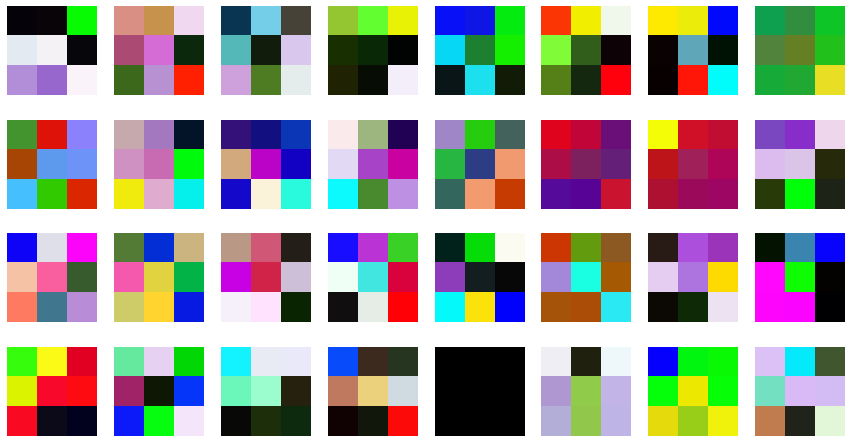

In [ ]:
# Extract the weights of the FIRST convolutional layer
layer_name = 'stem_conv'
visualize_filters(layer_name)

Visualizing the filters of a convolutional layer can be useful to understand the features that the network has learned to extract from the input data. However, it is a limited technique for two reasons. Firstly, filter visualization is only useful for shallow layers, while deeper layers in the network are responsible for detecting more complex and abstract features, and filters learned in these layers tend to be less interpretable. Secondly, because small filters provide a limited view from which patterns are less recognisable. 


In the case of EfficientNet, these two aspects are evident, as the convolutions are performed with small filters (3x3 in the first block, as shown in the image, and smaller afterwards), which makes it difficult at first glance to interpret filters in a meaningful manner. In addition, deeper convolutional layers cannot be visualized effectively consisting of multiple branches, each with multiple convolutional layers and pooling layers, and their outputs are merged. As a result, other techniques should be investigated to better explain the netfunctioning.


## Resnet


In [ ]:
def visualize_filters(layer_name):

  # Extract the weights of the first convolutional layer
  layer = model.get_layer(name=layer_name)
  filters = np.array(layer.get_weights()[0])
  print("\tName: ",layer.name, "\t\tFilters: ", filters.shape)

  # Plot the filters
  c= 8
  r= int(np.ceil(filters.shape[3]/c))
  fig, axes = plt.subplots(nrows=r, ncols=c, figsize=(20, 22))
  for i, ax in enumerate(axes.flat):
      if (i<filters.shape[3]): ax.imshow((filters[:,:,0,i] * 255).astype(np.uint8))
      ax.axis('off')
  plt.show()

In [ ]:
# Load the trained model
model = tfk.models.load_model("/content/gdrive/MyDrive/AI project/models/ResNet_model_03012023")

In [ ]:
model.summary()

	Name:  conv2d 		Filters:  (3, 3, 1, 64)


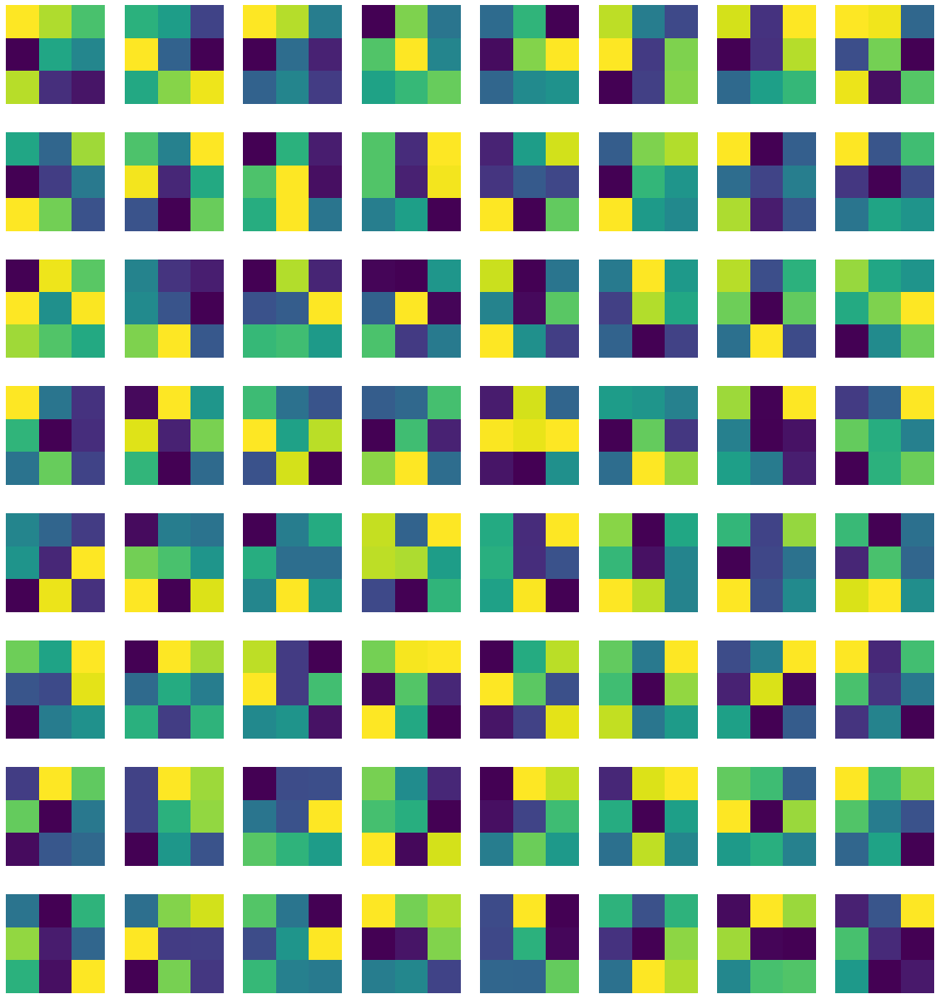

In [ ]:
# Extract the weights of the FIRST convolutional layer
layer_name = 'conv2d'
visualize_filters(layer_name)

# Feature Maps visualization

## CNN


In [ ]:
# Load the trained model
model = tfk.models.load_model("/content/gdrive/MyDrive/AI project/models/FromScratchWithClassWeights")

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 100, 100, 1)]     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 100, 100, 32)      320       
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 50, 50, 32)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 50, 50, 64)        18496     
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 25, 25, 64)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 25, 25, 128)       73856 

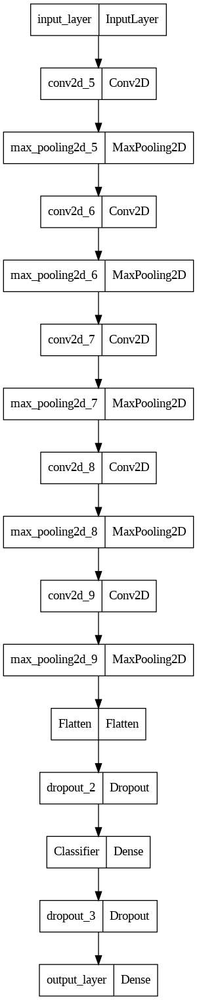

In [ ]:
tfk.utils.plot_model(
    model,
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
)

In [ ]:
def plot_feature_maps(model, layers, image, filters = [-1]):
    for j,layer in enumerate(layers):
        layer_output = tfk.Sequential(model.layers[:layer]).predict(image, verbose=0)
        
        if filters== [-1]: 
          nfilters = layer_output.shape[3]
        else:
          nfilters = len(filters)

        size     = layer_output.shape[2]
        
        # We will tile our images in this matrix
        display_grid = np.zeros((size, size * nfilters))

        if filters==[-1]:
          # Postprocess the feature to be visually palatable
          for i in range(nfilters):
            x  = layer_output[0, :, :, i]
            x -= x.mean()
            x /= x.std ()
            x *=  64
            x += 128
            x  = np.clip(x, 0, 255).astype('uint8')        
          
            # Tile each filter into a horizontal grid
            display_grid[:, i * size : (i + 1) * size] = x
        else:  
          for i in range(nfilters):
            x  = layer_output[0, :, :, filters[i]]
            x -= x.mean()
            x /= x.std ()
            x *=  64
            x += 128
            x  = np.clip(x, 0, 255).astype('uint8')        
          
            # Tile each filter into a horizontal grid
            display_grid[:, i * size : (i + 1) * size] = x
          

        # Display the grid
        scale = 25. / nfilters
        plt.figure( figsize=(scale * nfilters, scale) )
        plt.title ( 'layer n: ' + str(layers[j]) , fontsize = 20)
        plt.grid  ( False )
        plt.axis ('off')
        plt.imshow( display_grid, aspect='auto', cmap='gray')

Found 3093 images belonging to 1 classes.


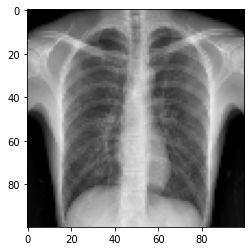

In [ ]:
image_to_be_explained, img_target = get1image(test_dir,'all/P01602_1.png', height=100, width=100)

In [ ]:
image_one_channel=image_to_be_explained[:,:,:,0]
image_right_dim = np.expand_dims(image_one_channel, axis=-1)

In [ ]:
layers = [2,3,4,5]

<ipython-input-47-7c4192290ff2>:20: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()
<ipython-input-47-7c4192290ff2>:3: RuntimeWarning: invalid value encountered in true_divide
  layer_output = tfk.Sequential(model.layers[:layer]).predict(image, verbose=0)


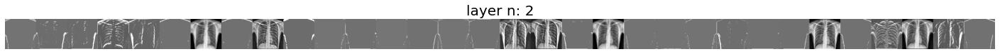

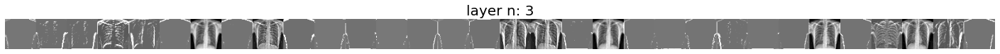

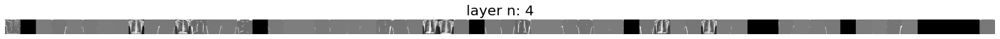

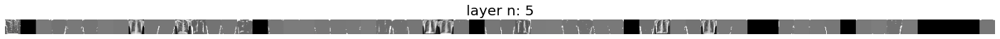

In [ ]:
plot_feature_maps(model, layers, image_right_dim)

<ipython-input-47-7c4192290ff2>:3: RuntimeWarning: invalid value encountered in true_divide
  layer_output = tfk.Sequential(model.layers[:layer]).predict(image, verbose=0)


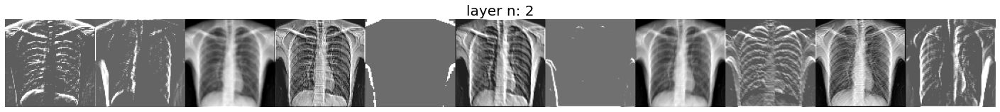

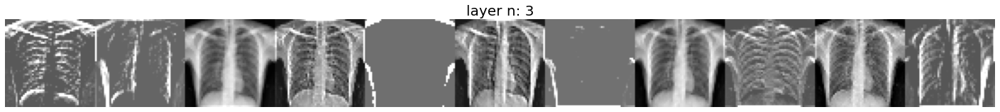

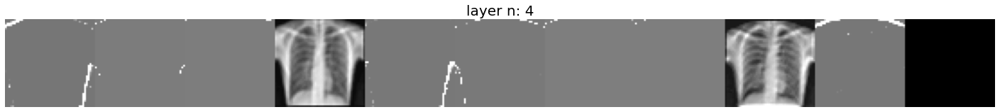

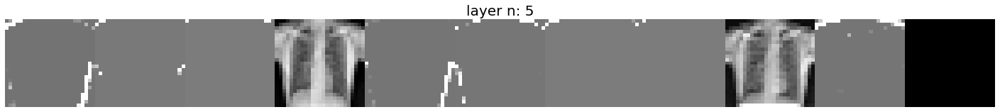

In [ ]:
filters = [3,4,6,8,9,17,18,19,28,29,30]
plot_feature_maps(model, layers, image_right_dim,filters)

## Resnet


In [ ]:
# Load the trained model
model = tfk.models.load_model("/content/gdrive/MyDrive/AI project/models/ResNet_model_03012023")

In [ ]:
# input: model, specific layer list, image, list of filters to be plotted

def plot_feature_maps_non_seq(model, layers, image, filters = [-1]):
    # for each layer and for each filter in the layer, plot the feature map
    for j,layer in enumerate(layers):
        # extract the output of the layer
        layer_output = model.get_layer(index=layer).output
        layer_output = tfk.Model(inputs=model.input, outputs=layer_output).predict(image, verbose=0)
        
        # if filters is -1, then plot all the filters in the layer
        if filters== [-1]: 
          nfilters = layer_output.shape[3]
        else:
        # else plot only the filters specified in the list
          nfilters = len(filters)

        size     = layer_output.shape[2]
        
        # We will tile our images in this matrix
        display_grid = np.zeros((size, size * nfilters))

        if filters==[-1]:
          # Postprocess the feature to be visually palatable
          for i in range(nfilters):
            x  = layer_output[0, :, :, i]
            x -= x.mean()
            x /= x.std ()
            x *=  64
            x += 128
            x  = np.clip(x, 0, 255).astype('uint8')        
          
            # Tile each filter into a horizontal grid
            display_grid[:, i * size : (i + 1) * size] = x
        else:  
          for i in range(nfilters):
            x  = layer_output[0, :, :, filters[i]]
            x -= x.mean()
            x /= x.std ()
            x *=  64
            x += 128
            x  = np.clip(x, 0, 255).astype('uint8')        
          
            # Tile each filter into a horizontal grid
            display_grid[:, i * size : (i + 1) * size] = x
          

        # Display the grid
        scale = (25. / nfilters)*0.7
        plt.figure( figsize=(scale * nfilters, scale) )
        plt.title ( 'layer n: ' + str(layers[j]) , fontsize = 20)
        plt.grid  ( False )
        plt.axis ('off')
        plt.imshow( display_grid, aspect='auto', cmap='gray')

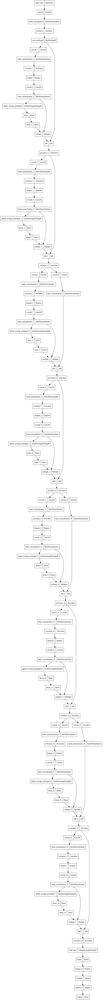

In [ ]:
tfk.utils.plot_model(
    model,
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
)

In [ ]:
for i,l in enumerate(model.layers): print(i, " : ", l.name, " - ", l.output_shape)

0  :  input_layer  -  [(None, 100, 100, 1)]
1  :  conv2d  -  (None, 100, 100, 64)
2  :  batch_normalization  -  (None, 100, 100, 64)
3  :  activation  -  (None, 100, 100, 64)
4  :  max_pooling2d  -  (None, 50, 50, 64)
5  :  conv2d_1  -  (None, 50, 50, 64)
6  :  batch_normalization_1  -  (None, 50, 50, 64)
7  :  activation_1  -  (None, 50, 50, 64)
8  :  dropout  -  (None, 50, 50, 64)
9  :  conv2d_2  -  (None, 50, 50, 64)
10  :  batch_normalization_2  -  (None, 50, 50, 64)
11  :  global_average_pooling2d  -  (None, 64)
12  :  dense  -  (None, 4)
13  :  dense_1  -  (None, 64)
14  :  multiply  -  (None, 50, 50, 64)
15  :  add  -  (None, 50, 50, 64)
16  :  activation_2  -  (None, 50, 50, 64)
17  :  conv2d_3  -  (None, 50, 50, 64)
18  :  batch_normalization_3  -  (None, 50, 50, 64)
19  :  activation_3  -  (None, 50, 50, 64)
20  :  dropout_1  -  (None, 50, 50, 64)
21  :  conv2d_4  -  (None, 50, 50, 64)
22  :  batch_normalization_4  -  (None, 50, 50, 64)
23  :  global_average_pooling2d_1  -  (

In [ ]:
layers = [3,7,16,28,42,54,68,80,94,106]

Found 3093 images belonging to 1 classes.


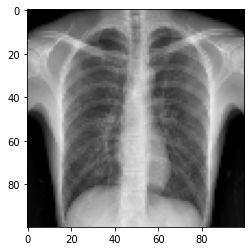

In [ ]:
image_to_be_explained, img_target = get1image(test_dir,'all/P01602_1.png', height=100, width=100)

In [ ]:
model.get_layer(index=80).name

'activation_12'

In [ ]:
image_one_channel=image_to_be_explained[:,:,:,0]
image_right_dim = np.expand_dims(image_one_channel, axis=-1)

<ipython-input-179-9c7657f84d41>:38: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std ()


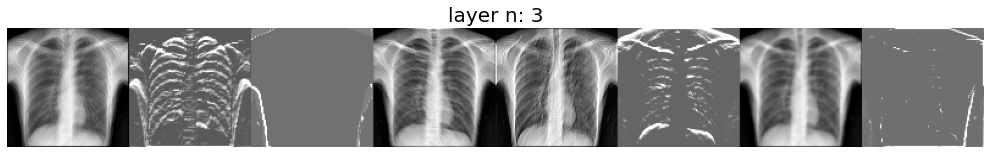

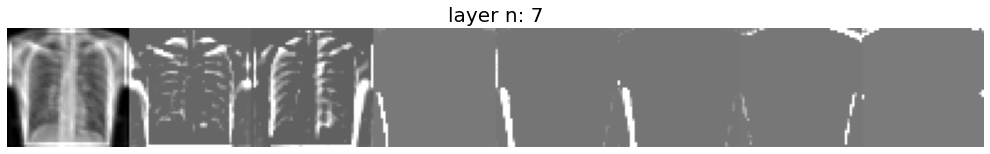

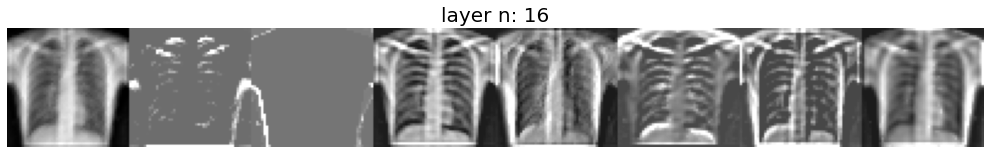

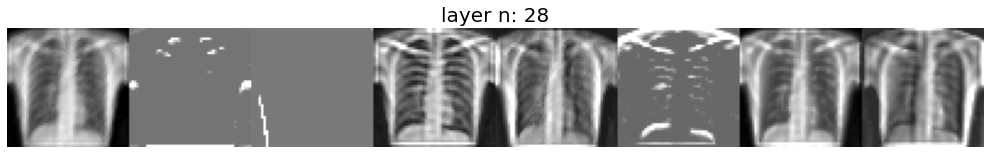

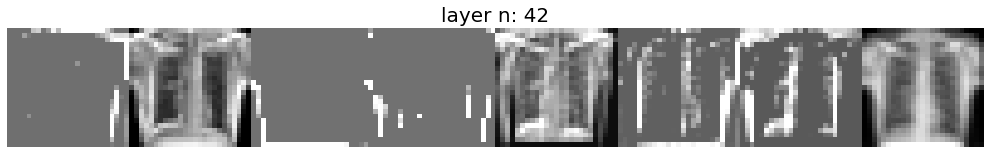

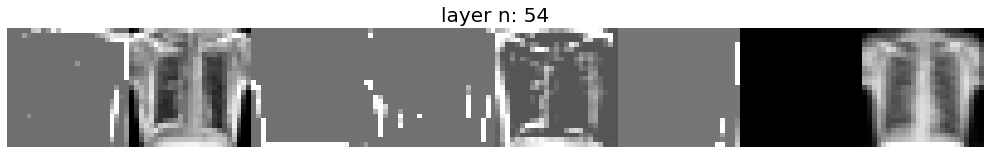

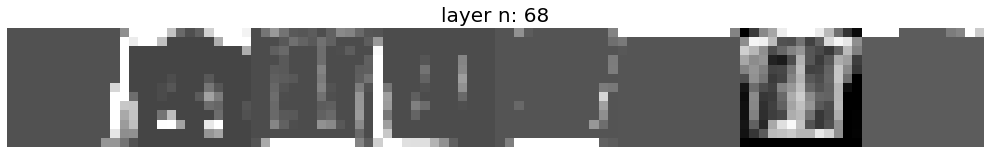

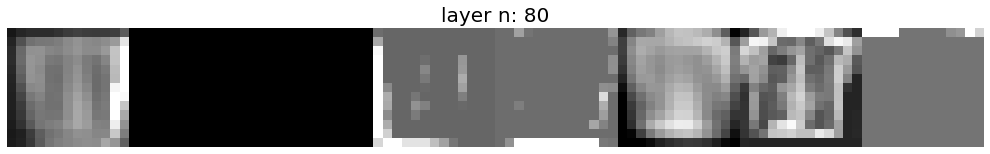

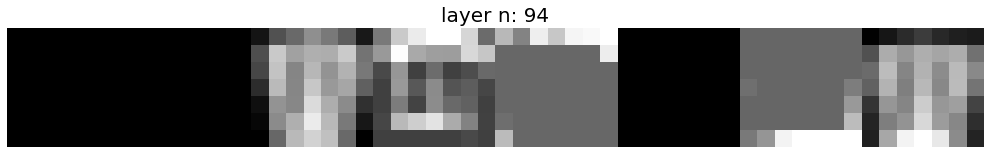

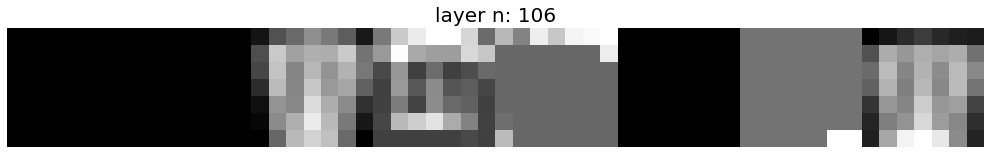

In [ ]:
plot_feature_maps_non_seq(model, layers, image_right_dim, filters= range(8))

## Effnet


In [ ]:
# Load the trained model
model = tfk.models.load_model("/content/gdrive/MyDrive/AI project/models/EffNet_model_training2b_04_01")

In [ ]:
# input: model, specific layer list, image, list of filters to be plotted

def plot_feature_maps_non_seq(model, layers, image, filters = [-1]):
    # for each layer and for each filter in the layer, plot the feature map
    for j,layer in enumerate(layers):
        # extract the output of the layer
        layer_output = model.get_layer(index=layer).output
        layer_output = tfk.Model(inputs=model.input, outputs=layer_output).predict(image, verbose=0)
        
        # if filters is -1, then plot all the filters in the layer
        if filters== [-1]: 
          nfilters = layer_output.shape[3]
        else:
        # else plot only the filters specified in the list
          nfilters = len(filters)

        size     = layer_output.shape[2]
        
        # We will tile our images in this matrix
        display_grid = np.zeros((size, size * nfilters))

        if filters==[-1]:
          # Postprocess the feature to be visually palatable
          for i in range(nfilters):
            x  = layer_output[0, :, :, i]
            x -= x.mean()
            x /= x.std ()
            x *=  64
            x += 128
            x  = np.clip(x, 0, 255).astype('uint8')        
          
            # Tile each filter into a horizontal grid
            display_grid[:, i * size : (i + 1) * size] = x
        else:  
          for i in range(nfilters):
            x  = layer_output[0, :, :, filters[i]]
            x -= x.mean()
            x /= x.std ()
            x *=  64
            x += 128
            x  = np.clip(x, 0, 255).astype('uint8')        
          
            # Tile each filter into a horizontal grid
            display_grid[:, i * size : (i + 1) * size] = x
          

        # Display the grid
        scale = 25. / nfilters
        plt.figure( figsize=(scale * nfilters, scale) )
        plt.title ( 'layer n: ' + str(layers[j]) , fontsize = 20)
        plt.grid  ( False )
        plt.axis ('off')
        plt.imshow( display_grid, aspect='auto', cmap='gray')

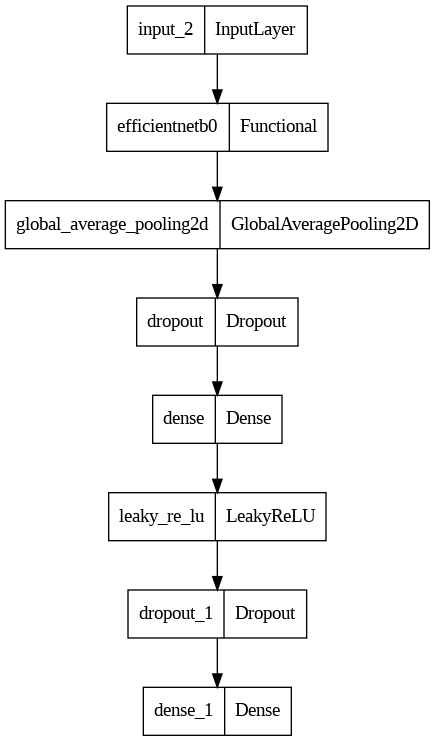

In [ ]:
tfk.utils.plot_model(
    model,
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
)

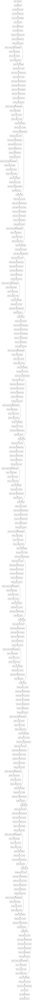

In [ ]:
tfk.utils.plot_model(
    model.get_layer('efficientnetb0'),
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
)

In [ ]:
for i,l in enumerate(model.layers): print(i, " : ", l.name, " - ", l.output_shape)

0  :  input_2  -  [(None, 224, 224, 3)]
1  :  efficientnetb0  -  (None, 7, 7, 1280)
2  :  global_average_pooling2d  -  (None, 1280)
3  :  dropout  -  (None, 1280)
4  :  dense  -  (None, 512)
5  :  leaky_re_lu  -  (None, 512)
6  :  dropout_1  -  (None, 512)
7  :  dense_1  -  (None, 3)


In [ ]:
for i,l in enumerate(model.get_layer('efficientnetb0').layers): print(i, " : ", l.name, " - ", l.output_shape)

0  :  input_1  -  [(None, 224, 224, 3)]
1  :  rescaling  -  (None, 224, 224, 3)
2  :  normalization  -  (None, 224, 224, 3)
3  :  tf.math.truediv  -  (None, 224, 224, 3)
4  :  stem_conv_pad  -  (None, 225, 225, 3)
5  :  stem_conv  -  (None, 112, 112, 32)
6  :  stem_bn  -  (None, 112, 112, 32)
7  :  stem_activation  -  (None, 112, 112, 32)
8  :  block1a_dwconv  -  (None, 112, 112, 32)
9  :  block1a_bn  -  (None, 112, 112, 32)
10  :  block1a_activation  -  (None, 112, 112, 32)
11  :  block1a_se_squeeze  -  (None, 32)
12  :  block1a_se_reshape  -  (None, 1, 1, 32)
13  :  block1a_se_reduce  -  (None, 1, 1, 8)
14  :  block1a_se_expand  -  (None, 1, 1, 32)
15  :  block1a_se_excite  -  (None, 112, 112, 32)
16  :  block1a_project_conv  -  (None, 112, 112, 16)
17  :  block1a_project_bn  -  (None, 112, 112, 16)
18  :  block2a_expand_conv  -  (None, 112, 112, 96)
19  :  block2a_expand_bn  -  (None, 112, 112, 96)
20  :  block2a_expand_activation  -  (None, 112, 112, 96)
21  :  block2a_dwconv_pad  

Found 3093 images belonging to 1 classes.


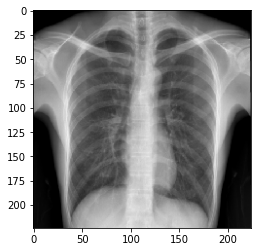

In [ ]:
image_to_be_explained, img_target = get1image(test_dir,'all/P01602_1.png', height=224, width=224)

In [ ]:
#image_one_channel=image_to_be_explained[:,:,:,0]
image_right_dim = np.expand_dims(image_to_be_explained, axis=-1)

In [ ]:
filters = range(8)
plot_feature_maps_non_seq(model, [1], image_right_dim, [])

# LIME


In [ ]:
model = tfk.models.load_model("/content/gdrive/MyDrive/AI project/models/EffNet_model_training2b_04_01")

In [ ]:
#@title LIME functions

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from skimage.segmentation import mark_boundaries

def make_prediction(img):
    preds = model.predict(img*255)
    return preds

def get_lime_explainer(image_to_be_explained):
  # Get explainer instance on the given image
  exp = lime_image.LimeImageExplainer().explain_instance((image_to_be_explained[0,:,:,:].astype('double'))/255, 
                                        make_prediction, 
                                        random_seed = seed,
                                        #num_samples=10, # size of the neighborhood to learn the linear model
                                        num_features = 1000, # maximum number of features present in explanation
                                        hide_color=0, 
                                        top_labels=3 
                                        )
  return exp


def visualize_lime(explainer, image_to_be_explained, target):
  ans = exp.segments
  fig, axes = plt.subplots(1, 4, figsize=(25,30))
  axes.flat
  axes[0].imshow(np.double(image_to_be_explained[0]/255),cmap='gray')
  axes[0].set_title("Inuput image - "+ target)
  axes[0].axis('off')

  for i in range(3):
    dict_heatmap = dict(explainer.local_exp[i])
    heatmap = np.vectorize(dict_heatmap.get)(ans)
    im = axes[i+1].imshow(heatmap, cmap = 'viridis', vmin  = -heatmap.max(), vmax = heatmap.max())
    axes[i+1].set_title(labels[i])
    axes[i+1].axis('off')
    divider = make_axes_locatable(axes[i+1])
    cax = divider.append_axes("right", size="5%", pad=0.05) 
    fig.colorbar(im, cax=cax)

def visualize_lime_2(explainer, image_to_be_explained,target):
  fig, axes = plt.subplots(1, 4, figsize=(25,30))
  axes.flat
  axes[0].imshow(np.double(image_to_be_explained[0]/255),cmap='gray')
  axes[0].set_title("Inuput image - "+target)
  axes[0].axis('off')

  for i in range(3):
    temp_1, mask_1 = exp.get_image_and_mask(i, positive_only=False, num_features=10, hide_rest=False)
    im = axes[i+1].imshow(mark_boundaries(temp_1, mask_1))
    axes[i+1].set_title(labels[i])
    axes[i+1].axis('off')


In [ ]:
image_p = ('all/P01602_1.png') #Normal 
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_target=list(img_target)[0]

In [ ]:
exp = get_lime_explainer(image_to_be_explained)

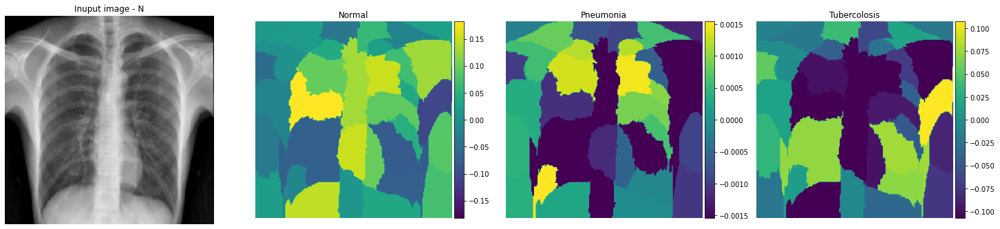

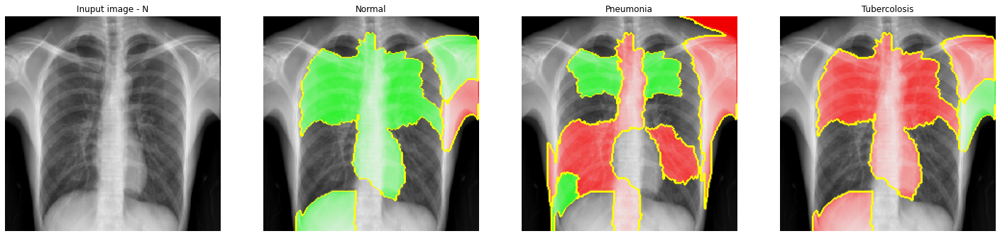

In [ ]:
visualize_lime(exp, image_to_be_explained, img_target)
visualize_lime_2(exp, image_to_be_explained, img_target)

In [ ]:
image_p = ('all/P01919_1.jpeg') #Normal noisy
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_target=list(img_target)[0]

In [ ]:
exp = get_lime_explainer(image_to_be_explained)

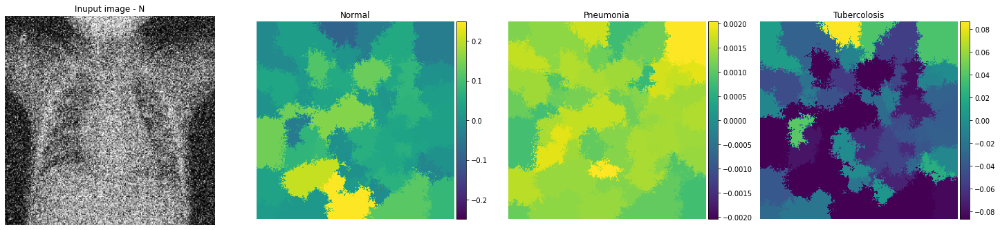

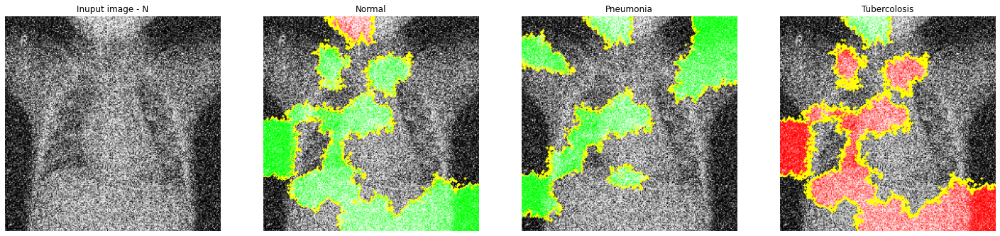

In [ ]:
visualize_lime(exp, image_to_be_explained, img_target)
visualize_lime_2(exp, image_to_be_explained, img_target)

In [ ]:
image_p = ('all/P00397_1.png') #Tuberculosis
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_target=list(img_target)[0]

In [ ]:
exp = get_lime_explainer(image_to_be_explained)

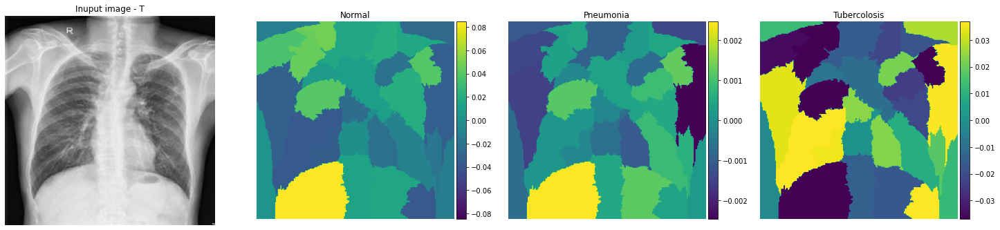

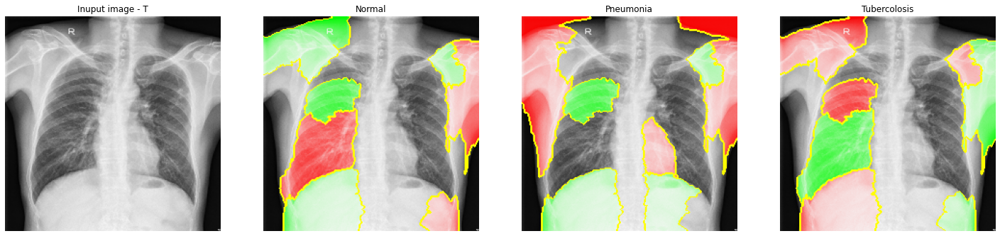

In [ ]:
visualize_lime(exp, image_to_be_explained, img_target)
visualize_lime_2(exp, image_to_be_explained, img_target)

In [ ]:
image_p = ('all/P01613_1.jpeg') #Pneumonia
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_target=list(img_target)[0]

In [ ]:
exp = get_lime_explainer(image_to_be_explained)

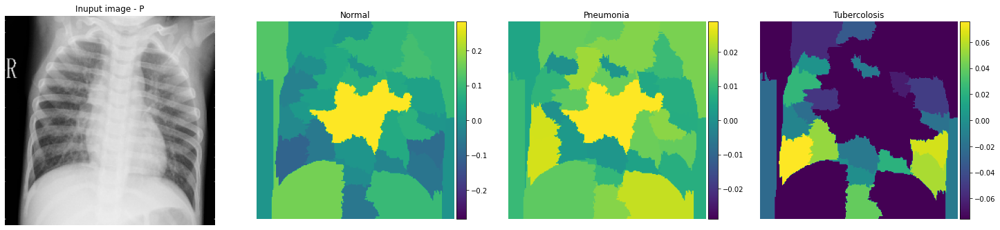

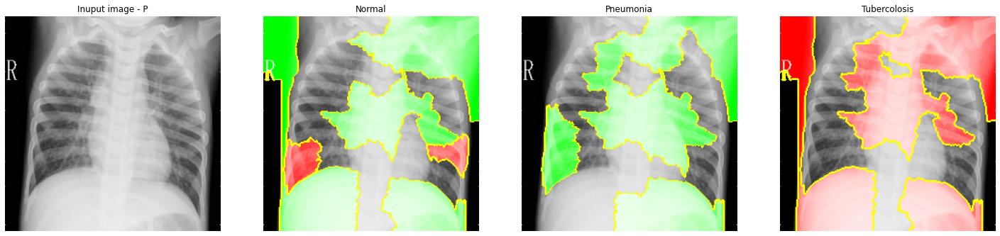

In [ ]:
visualize_lime(exp, image_to_be_explained, img_target)
visualize_lime_2(exp, image_to_be_explained, img_target)

# Occlusion


In [ ]:
#@title Get occlusion 

def get_occlusion(image_to_be_explained_, img_target_, num_occ_patches, num_inv_occ_patches):
  sense_map = get_sensitivity_map(model, image_to_be_explained_, img_target_, PATCH_SIZE= int(np.round(image_to_be_explained_.shape[0]/num_occ_patches)))
  inverted_sense_map = get_patch_preservation_sensitivity_map(model, image_to_be_explained_, img_target_, PATCH_SIZE= int(np.round(image_to_be_explained_.shape[0]/num_inv_occ_patches)))

  return sense_map, inverted_sense_map

def visualize_occlusion(image_to_be_explained_, img_target_, sense_map, inverted_sense_map):
  fig, axes = plt.subplots(1, 3, figsize=(25,30))
  axes.flat
  axes[0].imshow(np.double(image_to_be_explained_/255),cmap='gray')
  axes[0].set_title("Inuput image - "+labels[img_target_])
  axes[0].axis('off')

  axes[1].imshow(image_to_be_explained_, cmap='gray')
  im=axes[1].imshow(sense_map, cmap='YlGnBu', alpha=0.7)
  axes[1].set_title("Traditional occlusion")
  axes[1].axis('off')
  cax = make_axes_locatable(axes[1]).append_axes("right", size="5%", pad=0.05) 
  fig.colorbar(im, cax=cax)

  axes[2].imshow(image_to_be_explained_, cmap='gray')
  im=axes[2].imshow(inverted_sense_map, cmap='YlGnBu', alpha=0.5)
  axes[2].set_title("Inverted occlusion")
  axes[2].axis('off')
  cax = make_axes_locatable(axes[2]).append_axes("right", size="5%", pad=0.05) 
  fig.colorbar(im, cax=cax)


In [ ]:
#@title Occlusion functions

# Create function to apply a black patch on an image
def apply_black_patch(image, top_left_x, top_left_y, patch_size):
    patched_image = np.array(image, copy=True)
    patched_image[top_left_y:top_left_y + patch_size, top_left_x:top_left_x + patch_size] = 0

    return patched_image

# Create function to get the sensitivity map
def get_sensitivity_map(model, pure_image, pure_image_class, PATCH_SIZE=8):
    # Create a blank sensitivity map
    img = tf.keras.preprocessing.image.img_to_array(pure_image)
    img = img[:,:,0]

    sensitivity_map = np.zeros((img.shape[0], img.shape[1]))

    # Iterate the patch over the image
    for top_left_x in range(0, img.shape[0], PATCH_SIZE):
        for top_left_y in range(0, img.shape[1], PATCH_SIZE):
            patched_image = apply_black_patch(img, top_left_x, top_left_y, PATCH_SIZE)
            input = np.array([patched_image])
            resized_input = tf.expand_dims(input, axis=-1)
            predicted_classes = model.predict(resized_input)[0]
            confidence = predicted_classes[pure_image_class]
            
            # Save confidence for this specific patched image in map
            sensitivity_map[
                top_left_y:top_left_y + PATCH_SIZE,
                top_left_x:top_left_x + PATCH_SIZE,
            ] = confidence

    return sensitivity_map

In [ ]:
#@title Inverted occlusion functions
# Create function to make the whole image black except for the patch
def image_patch_preservation(image, top_left_x, top_left_y, patch_size):
    patched_image = np.zeros(image.shape)
    patched_image[top_left_y:top_left_y + patch_size, top_left_x:top_left_x + patch_size] = image[top_left_y:top_left_y + patch_size, top_left_x:top_left_x + patch_size]

    return patched_image

# Create function to get the patch preservation sensitivity map
def get_patch_preservation_sensitivity_map(model, pure_image, pure_image_class, PATCH_SIZE=8):
    # Create a blank sensitivity map
    img = tf.keras.preprocessing.image.img_to_array(pure_image)
    img = img[:,:,0]

    sensitivity_map = np.zeros((img.shape[0], img.shape[1]))

    # Iterate the patch over the image
    for top_left_x in range(0, img.shape[0], PATCH_SIZE):
        for top_left_y in range(0, img.shape[1], PATCH_SIZE):
            patched_image = image_patch_preservation(img, top_left_x, top_left_y, PATCH_SIZE)
            input = np.array([patched_image])
            resized_input = tf.expand_dims(input, axis=-1)
            predicted_classes = model.predict(resized_input)[0]
            confidence = predicted_classes[pure_image_class]
            
            # Save confidence for this specific patched image in map
            sensitivity_map[
                top_left_y:top_left_y + PATCH_SIZE,
                top_left_x:top_left_x + PATCH_SIZE,
            ] = confidence

    return sensitivity_map

In [ ]:
image_p = ('all/P01602_1.png') #Normal 
image_to_be_explained, img_target = get1image(test_dir,image_p)
image_to_be_explained_ = image_to_be_explained[0,:,:,0]
img_target_ = labels_3[img_target.values[0]]
sense_map, inverted_sense_map = get_occlusion(image_to_be_explained_, img_target_, 15, 3)

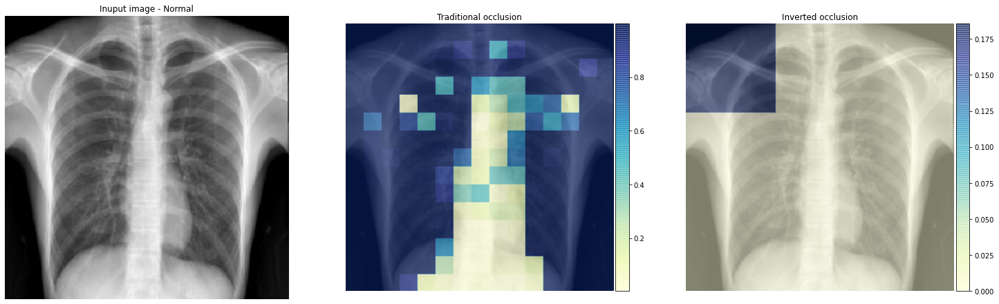

In [ ]:
visualize_occlusion(image_to_be_explained_, img_target_, sense_map, inverted_sense_map)

Found 3093 images belonging to 1 classes.
1/1 [==============================] - 0s 82ms/step


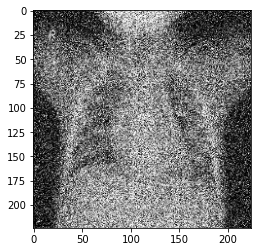

In [ ]:
image_p = ('all/P01919_1.jpeg') #Normal noisy
image_to_be_explained, img_target = get1image(test_dir,image_p)
image_to_be_explained_ = image_to_be_explained[0,:,:,0]
img_target_ = labels_3[img_target.values[0]]
sense_map, inverted_sense_map = get_occlusion(image_to_be_explained_, img_target_, 15, 3)

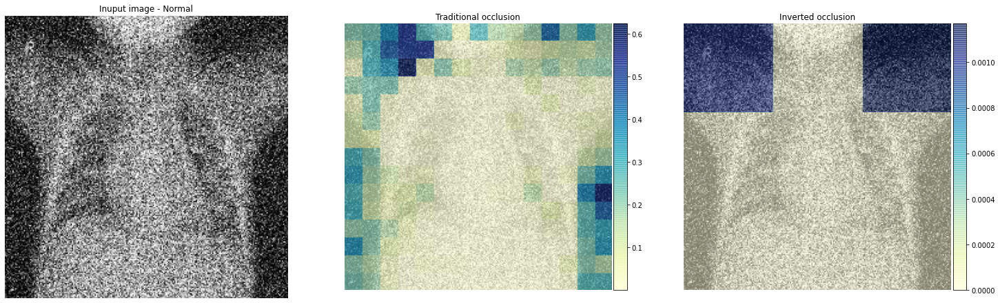

In [ ]:
visualize_occlusion(image_to_be_explained_, img_target_, sense_map, inverted_sense_map)

In [ ]:
image_p = ('all/P01613_1.jpeg') #Pneumonia
image_to_be_explained, img_target = get1image(test_dir,image_p)
image_to_be_explained_ = image_to_be_explained[0,:,:,0]
img_target_ = labels_3[img_target.values[0]]
sense_map, inverted_sense_map = get_occlusion(image_to_be_explained_, img_target_, 15, 3)

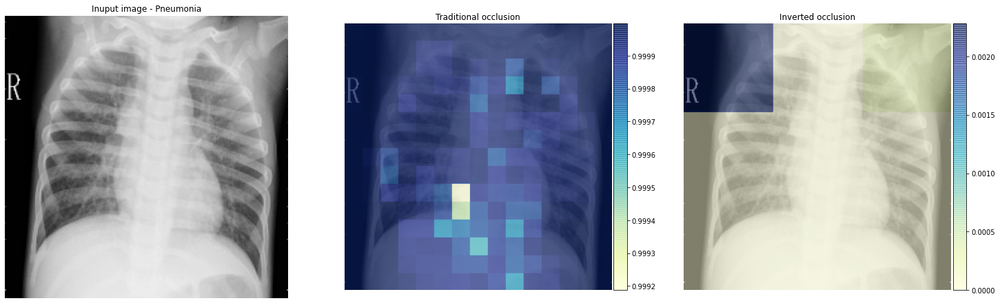

In [ ]:
visualize_occlusion(image_to_be_explained_, img_target_, sense_map, inverted_sense_map)

In [ ]:
image_p = ('all/P00397_1.png') #Tuberculosis
image_to_be_explained, img_target = get1image(test_dir,image_p)
image_to_be_explained_ = image_to_be_explained[0,:,:,0]
img_target_ = labels_3[img_target.values[0]]
sense_map, inverted_sense_map = get_occlusion(image_to_be_explained_, img_target_, 15, 3)

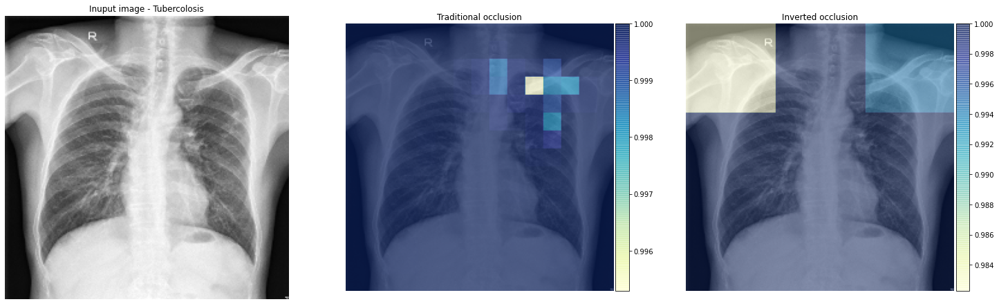

In [ ]:
visualize_occlusion(image_to_be_explained_, img_target_, sense_map, inverted_sense_map)

#GradCAM

In [7]:
model = tfk.models.load_model("/content/gdrive/MyDrive/AI project/models/5.2. HMP_EffNet_model_30_01")

In [8]:
#@title Create another model (model1), the same as the original (to be unpacked)
base_model = tfk.applications.EfficientNetB0(
    include_top = False,
    weights = "imagenet",
    input_shape = (224, 224, 3)
)

base_model.trainable = False

dp_rate1 = 0.3
dp_rate2 = 0.3
nc = 512
elastic_lambda= 1e-3

x = tfk.layers.GlobalAveragePooling2D()(base_model.output)
x = tfkl.Dropout(dp_rate1, seed=seed)(x)
x = tfkl.Dense( 
      units=nc, 
      kernel_initializer = tfk.initializers.HeUniform(seed),
      kernel_regularizer=tf.keras.regularizers.L1L2(elastic_lambda,elastic_lambda))(x)
x=tfkl.LeakyReLU()(x)
x = tfkl.Dropout(dp_rate2, seed=seed)(x)
outputs = tfkl.Dense(
      3, 
      activation='softmax',
      kernel_initializer = tfk.initializers.GlorotUniform(seed))(x)

model1 = tfk.Model(base_model.input, outputs, name='model1')

16705208/16705208 [==============================] - 0s 0us/step


In [9]:
#@title Set the weights from loaded model
for i, layer in enumerate(model.get_layer('efficientnetb0').layers):
  model1.layers[i].set_weights( layer.get_weights() )

for i in range(-1, -7, -1):
  model1.layers[i].set_weights( model.layers[i].get_weights() )

This operation is needed to be able to access to each single layer of the supernet as if it was inn the original one. The model is exactly the same as the previous one, but all layers are at the same level now.

Found 3093 images belonging to 1 classes.


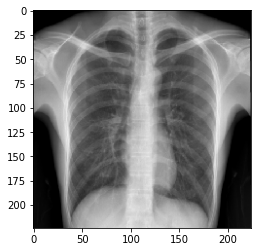

In [10]:
image_p = ('all/P01602_1.png') #Normal 
image_to_be_explained, img_target = get1image(test_dir,image_p)

In [11]:
print('Original model pred: ', model.predict(image_to_be_explained), 'Explained model pred: ', model1.predict(image_to_be_explained), ". As you can see they are the same!")

1/1 [==============================] - 2s 2s/step
Original model pred:  [[9.9999738e-01 3.8972843e-08 2.6417495e-06]] Explained model pred:  [[9.9999738e-01 3.8972917e-08 2.6417545e-06]] . As you can see they are the same!


In [56]:
#@title GradCAM functions
def GradCam(model, img_batch1, layer_name, eps=1e-8, show_gradcam='predicted', w=224, h=224):
    '''
      Creates a grad-cam heatmap given a model and a layer name contained with that model
      
      Args:
        model: tf model
        img_batch1: (1 x img_width x img_width x 3) numpy array, with values 0-255 as to be predicted by the model
        layer_name: str
      Returns 
        uint8 numpy array with shape (img_height, img_width), and the prediction
    '''
    img_array = img_batch1[0]

    gradModel = tfk.Model(
			inputs=[model.inputs],
			outputs=[model.get_layer(layer_name).output,
				model.output])
    
    with tf.GradientTape() as tape:
			# cast the image tensor to a float-32 data type, pass the
			# image through the gradient model, and grab the loss
			# associated with the specific class index

      # Convert the numpy array to a tensor
      tensor = tf.expand_dims(img_array, axis=-1)
      tensor = tf.expand_dims(tensor, axis=0)

      # Print the shape of the tensor
      #print(tensor.shape)  # Output: (1, 100, 100, 1)
      inputs = tensor
      
      (convOutputs, predictions) = gradModel(inputs)

      if show_gradcam=='predicted':
        loss = predictions[:,int(tf.math.argmax(predictions,axis=1))]
      else:
        loss = predictions[:, show_gradcam]


		# use automatic differentiation to compute the gradients
    grads = tape.gradient(loss, convOutputs)
    
    # compute the guided gradients
    castConvOutputs = tf.cast(convOutputs > 0, "float32")
    castGrads = tf.cast(grads > 0, "float32")
    guidedGrads = castConvOutputs * castGrads * grads
		# the convolution and guided gradients have a batch dimension
		# (which we don't need) so let's grab the volume itself and
		# discard the batch
    convOutputs = convOutputs[0]
    guidedGrads = guidedGrads[0]
    # compute the average of the gradient values, and using them
		# as weights, compute the ponderation of the filters with
		# respect to the weights
    weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
    cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)
  
    # grab the spatial dimensions of the input image and resize
		# the output class activation map to match the input image
		# dimensions
    heatmap = cv2.resize(cam.numpy(), (w, h))
		# return the resulting heatmap to the calling function
    return heatmap,predictions


def display_gradcam(img_batch1, heatmap, target, pred):
  '''
      Display the gradCAM heatmap
      
      Args:
        img_batch1: (1 x img_width x img_width x 3) numpy array, with values 0-255 as to be predicted by the model
        heatmap: uint8 numpy array with shape (img_height, img_width)
    '''
  pred = np.argmax(pred)
  pred = ['N' if pred==0  else('P' if pred==1 else 'T' )]
  img = img_batch1[0]/255 # 0-1

  # Display Grad CAM
  fig = plt.figure(figsize=(10,10))
  plt.imshow(img)
  im = plt.imshow(heatmap, cmap='jet', alpha=0.5)
  fig.colorbar(im)
  target = str(target)
  pred = str(pred)
  title=str(["Target: "+ target[2:-2] + " - Predicted as: " + pred[2:-2] ])
  plt.title(title[2:-2])
  

  return

  
def display_gradcam(img_batch1, heatmap, target, pred):
  '''
      Display the gradCAM heatmap
      
      Args:
        img_batch1: (1 x img_width x img_width x 3) numpy array, with values 0-255 as to be predicted by the model
        heatmap: uint8 numpy array with shape (img_height, img_width)
    '''
  pred = np.argmax(pred)
  pred = ['N' if pred==0  else('P' if pred==1 else 'T' )]
  img = img_batch1[0]/255 # 0-1

  # Display Grad CAM
  fig = plt.figure(figsize=(10,20))
  plt.subplot(1,2,1)
  plt.imshow(img)
  img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')

  plt.subplot(1,2,2)
  plt.imshow(img)
  im = plt.imshow(heatmap, cmap='jet', alpha=0.5)
  fig.colorbar(im)

  title=str(["Target: "+ target[2:-2] + " - Predicted as: " + pred[2:-2] ])
  #plt.title(title[2:-2])
  

  return


from mpl_toolkits.axes_grid1 import make_axes_locatable
def visualizeGradCAM(img_batch1, heatmap, target, pred):
  pred = np.argmax(pred)
  pred = ['N' if pred==0  else('P' if pred==1 else 'T' )]
  img = img_batch1[0]/255 # 0-1
  target = str(target)
  pred = str(pred)

  fig, axes = plt.subplots(1, 2, figsize=(20,20))
  axes.flat
  axes[0].imshow(img)
  axes[0].set_title("Inuput image - "+ target[2:-2])
  axes[0].axis('off')

  axes[1].imshow(img)
  im=axes[1].imshow(heatmap, cmap='jet', alpha=0.5)
  title = str(["GradCAM for predicted class: " + pred[2:-2]])
  axes[1].set_title(title[2:-2])
  axes[1].axis('off')
  cax = make_axes_locatable(axes[1]).append_axes("right", size="5%", pad=0.05) 
  fig.colorbar(im, cax=cax)

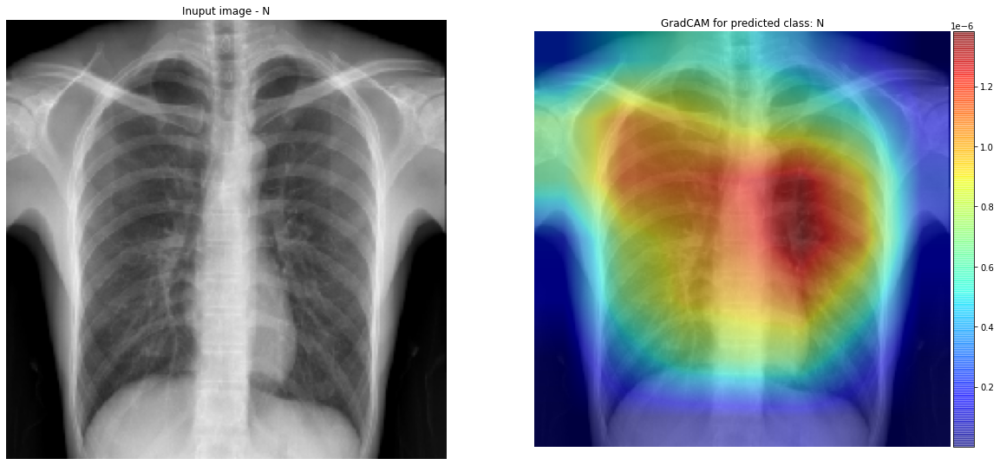

In [45]:
image_p = ('all/P05049_1.png') #Normal correct
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')
visualizeGradCAM(image_to_be_explained, img_heatmap, list(img_target), img_prediction)





Found 3093 images belonging to 1 classes.


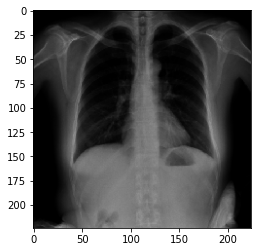

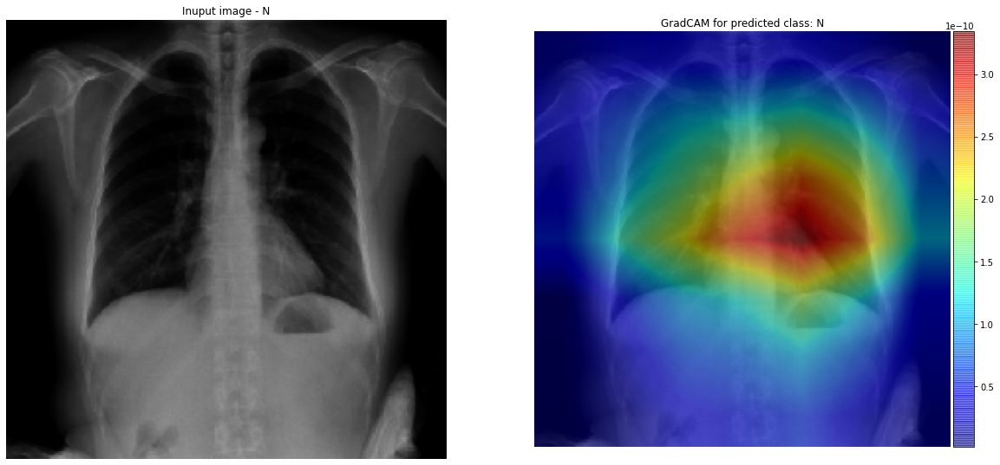

In [46]:
image_p = ('all/P05049_1.png') #Normal correct
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')
visualizeGradCAM(image_to_be_explained, img_heatmap, list(img_target), img_prediction)

Found 3093 images belonging to 1 classes.


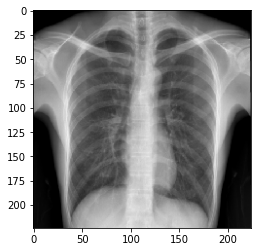

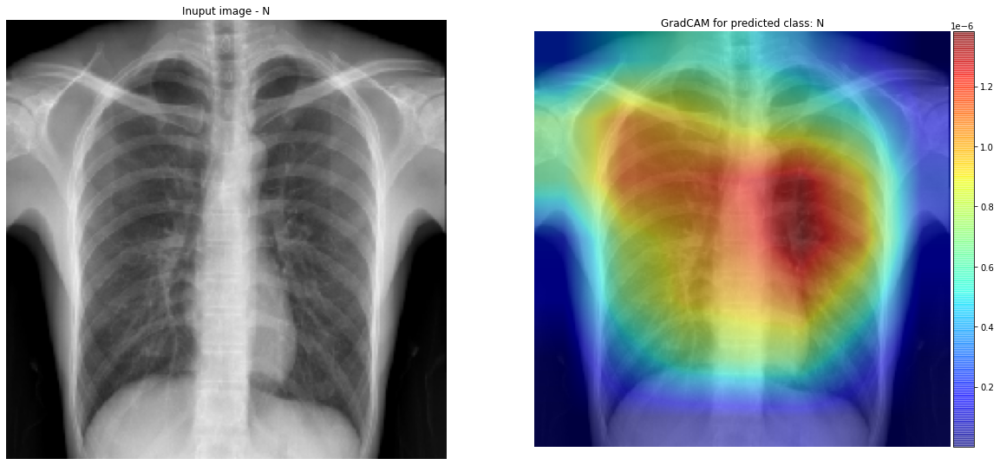

In [47]:
image_p = ('all/P01602_1.png') #Normal
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')
visualizeGradCAM(image_to_be_explained, img_heatmap, list(img_target), img_prediction)

Found 3093 images belonging to 1 classes.


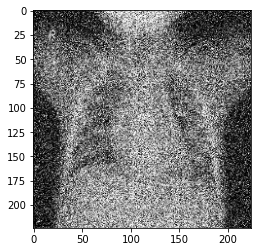

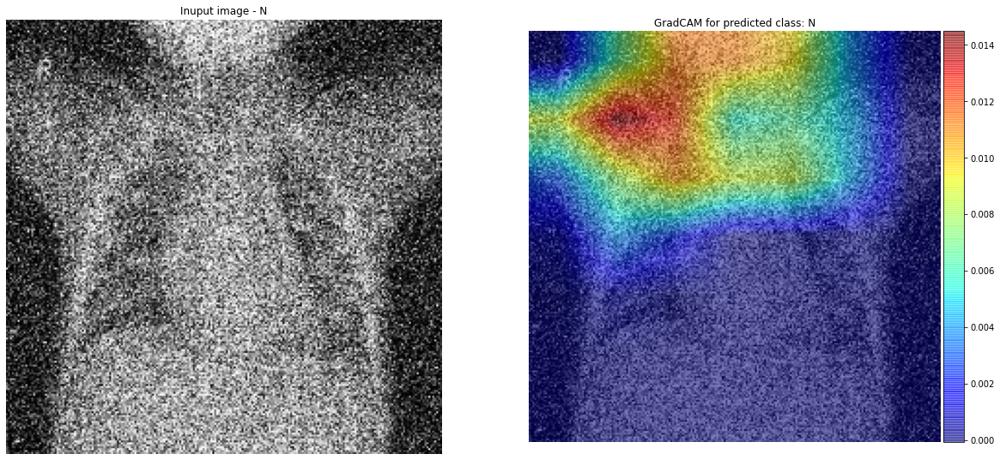

In [48]:
image_p = ('all/P01919_1.jpeg') #Normal noisy
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')
visualizeGradCAM(image_to_be_explained, img_heatmap, list(img_target), img_prediction)

Found 3093 images belonging to 1 classes.


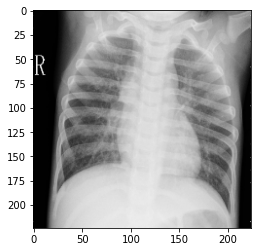

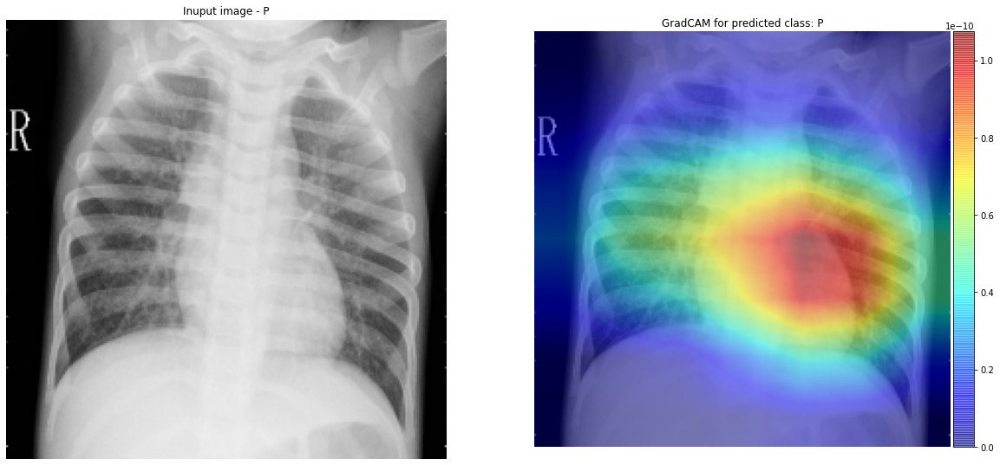

In [49]:
image_p = ('all/P01613_1.jpeg') #Pneumonia
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')
visualizeGradCAM(image_to_be_explained, img_heatmap, list(img_target), img_prediction)

Found 3093 images belonging to 1 classes.


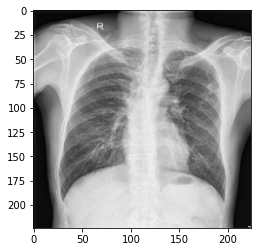

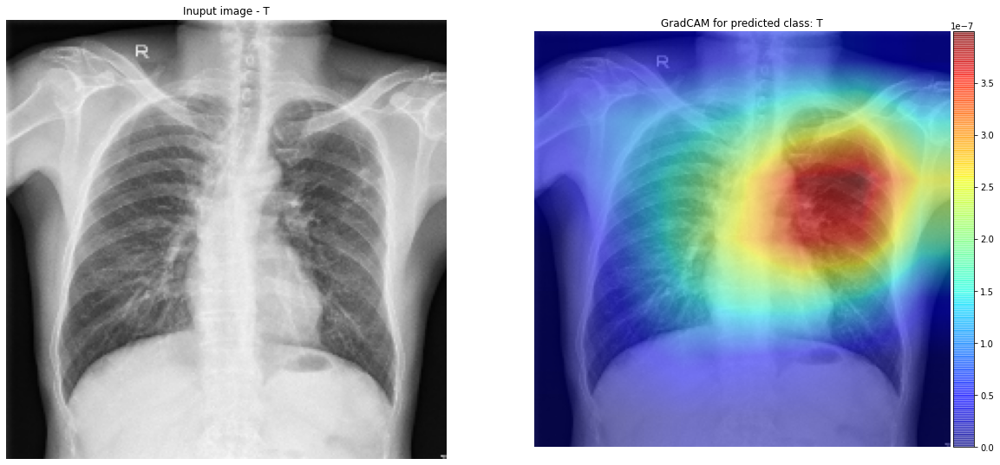

In [50]:
image_p = ('all/P00397_1.png') #Tuberculosis
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')
visualizeGradCAM(image_to_be_explained, img_heatmap, list(img_target), img_prediction)

Found 3093 images belonging to 1 classes.


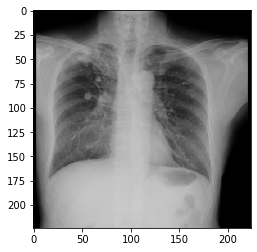

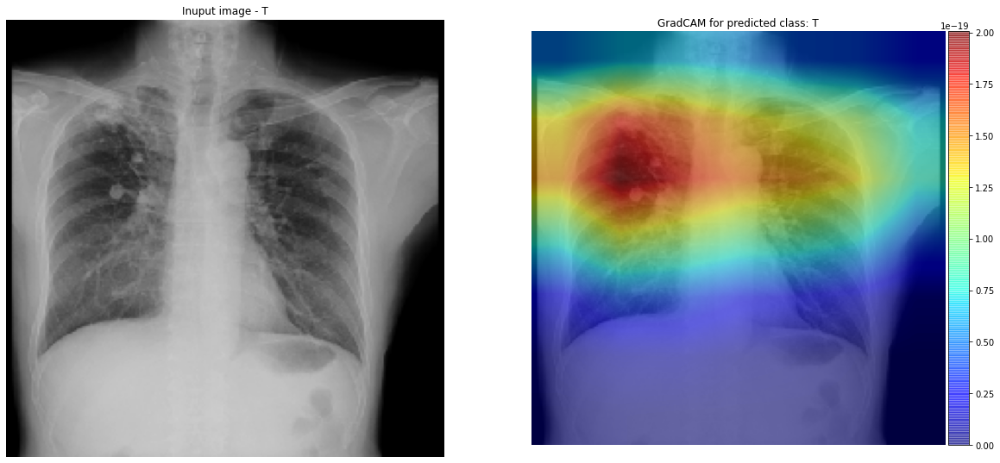

In [51]:
image_p = ('all/P12060_1.png') #Tuberculosis
image_to_be_explained, img_target = get1image(test_dir,image_p)
img_heatmap, img_prediction = GradCam(model1, image_to_be_explained, 'top_activation', eps=1e-8, show_gradcam='predicted')
visualizeGradCAM(image_to_be_explained, img_heatmap, list(img_target), img_prediction)